<h1><ins>Business Analytics for Yandex.Afisha</ins>  
  

<h2>Project description</h2><br>
Yandex.Afisha looking to optimize marketing expenses.<br><br><ins>Provided data:</ins><ul><li>Server logs with data on Yandex.Afisha visits from June 2017 through May 2018</li><li>Dump file with all orders for the period</li><li>Marketing expenses statistics</li></ul><ins>What needs to be studied:</ins> <ul><li>How people use the product</li><li>When they start to buy</li><li>How much money each customer brings</li><li>When they pay off</li></ul>

### <ins> Table of contents <ins><br>
1. [Downloading and preparing the data](#1)
2. [Analysis](#2)
    * 2.1 [Product](#2.1)
        * 2.1.1 [DAU, WAU, MAU](#2.1.1)
        * 2.1.2 [Number of Sessions](#2.1.2)
        * 2.1.3 [Session Length](#2.1.3)
        * 2.1.4 [Retention Rate](#2.1.4)
    * 2.2 [Sales](#2.2)
        * 2.2.1 [When people strart buying](#2.2.1)
        * 2.2.2 [Number of purchases](#2.2.2)
        * 2.2.3 [Purchase size](#2.2.3)
        * 2.2.4 [LTV](#2.2.4)
    * 2.3 [Marketing](#2.3)
        * 2.3.1 [Sources' and devices' conversion rates](#2.3.1)
        * 2.3.2 [How much money was spent? ](#2.3.2)
        * 2.3.3 [CAC](#2.3.3)
        * 2.3.4 [ROMI](#2.3.4)
3. [Conclusion](#3)

## <ins>1. Downloading and preparing the data</ins> <a id='1'></a>

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import pandas as pd
import math as mt
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import HTML

In [3]:
orders = pd.read_csv(r'C:\Users\levin\Datasets\orders_log_us.csv', 
                        dtype={'Revenue':'float32', 
                               'Uid':'uint32'},
                        parse_dates=['Buy Ts'])
visits = pd.read_csv(r'C:\Users\levin\Datasets\visits_log_us.csv', 
                        dtype={'Device':'category',
                              'Source Id':'int32',
                              'Uid':'uint32'},
                        parse_dates=['End Ts', 'Start Ts'])
costs = pd.read_csv(r'C:\Users\levin\Datasets\costs_us.csv', 
                       dtype={'source_id':'int32',
                              'costs':'float32'},
                       parse_dates=['dt'])

In [4]:
visits.columns = ['device', 'end_ts', 'source_id', 'start_ts', 'uid']
orders.columns = ['buy_ts', 'revenue', 'uid']

In [5]:
def duplicated_and_missing_values(dataframe):
    print('Number of duplicated rows:',dataframe.duplicated().sum())
    print('')
    print('Missing values:')
    print(dataframe.isna().sum())

### Orders

In [6]:
orders.head()

,buy_ts,revenue,uid
0,2017-06-01 00:10:00,17.00,703267142
1,2017-06-01 00:25:00,0.55,3164732343
2,2017-06-01 00:27:00,0.37,3701119316
3,2017-06-01 00:29:00,0.55,1261964461
4,2017-06-01 07:58:00,0.37,897660474


In [7]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float32       
 2   uid      50415 non-null  uint32        
dtypes: datetime64[ns](1), float32(1), uint32(1)
memory usage: 787.9 KB


In [8]:
duplicated_and_missing_values(orders)

Number of duplicated rows: 0

Missing values:
buy_ts     0
revenue    0
uid        0
dtype: int64


### Visits

In [9]:
visits.head()

,device,end_ts,source_id,start_ts,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,2135980574
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,4106760796
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,2453961767
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,2904785574
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,4216757712


In [10]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  category      
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int32         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint32        
dtypes: category(1), datetime64[ns](2), int32(1), uint32(1)
memory usage: 8.6 MB


In [11]:
duplicated_and_missing_values(visits)

Number of duplicated rows: 0

Missing values:
device       0
end_ts       0
source_id    0
start_ts     0
uid          0
dtype: int64


### Costs

In [12]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.199997
1,1,2017-06-02,62.250000
2,1,2017-06-03,36.529999
3,1,2017-06-04,55.000000
4,1,2017-06-05,57.080002


In [13]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int32         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float32       
dtypes: datetime64[ns](1), float32(1), int32(1)
memory usage: 39.8 KB


In [14]:
duplicated_and_missing_values(costs)

Number of duplicated rows: 0

Missing values:
source_id    0
dt           0
costs        0
dtype: int64


<font color='navy'> Data types were changed, missing values and duplicates were checked.  
The data sets are ready for the analysis.</font>
    
------

## 2. <ins>Analysis</ins> <a id='2'></a>

## 2.1 Product <a id='2.1'></a>

### 2.1.1 DAU, WAU, MAU <a id='2.1.1'></a>

In [15]:
# Adding columns

visits['year'] = visits['start_ts'].dt.year
visits['week'] = visits['start_ts'].dt.isocalendar().week
visits['date'] = pd.to_datetime(visits['start_ts'].dt.date)
visits['year_month'] = visits['date'].dt.strftime('%Y-%m')

In [16]:
# Changing data type of added columns

visits['year'] = visits['year'].astype('int32')
visits['week'] = visits['week'].astype('int32')
visits['year_month'] = pd.to_datetime(visits['year_month'])

In [17]:
# Creating MAU/WAU/DAU tables and variables with mean

MAU_table = visits.groupby(['year_month'], as_index=False).agg({'uid':'nunique'})
MAU = int(visits.groupby(['year_month'], as_index=False).agg({'uid':'nunique'}).mean())

WAU_table = visits.groupby(['year', 'week'], as_index=False).agg({'uid':'nunique'})
WAU = int(visits.groupby(['year', 'week']).agg({'uid':'nunique'}).mean())

DAU_table = visits.groupby(['date'], as_index=False).agg({'uid':'nunique'})
DAU = int(visits.groupby(['date']).agg({'uid':'nunique'}).mean())

In [18]:
# Preparing DAU table for plot

DAU_table['date'] = pd.to_datetime(DAU_table['date'])
DAU_table['Day_week'] = DAU_table['date'].dt.day_name()
DAU_table['date'] = DAU_table['date'].astype('str')

In [138]:
fig = px.bar(MAU_table,
              x='year_month',
              y='uid', 
             color_discrete_sequence=["midnightblue"], height=450)
fig.update_layout(title_text='Monthly active users (MAU)',
                 xaxis_title_text="Month", 
                  yaxis_title_text='Unique users')
fig.show()
HTML(fig.to_html())

<font color='navy'> There is a peak of number of users in cold months (from october till march) and decrease in warm months. It can be related to seasonality - people more interested in different events during cold months. Also it can be related to marketing budget and strategy that were used in different months. </font>

In [20]:
WAU_table = WAU_table.reset_index()

fig = px.line(WAU_table,
              x='index',
              y='uid',
              hover_data=['year', 'week'],
              color_discrete_sequence=["salmon"], height=500)
fig.update_layout(title_text='Weekly active users (WAU)',
                 xaxis_title_text="Weeks", 
                  yaxis_title_text='Unique users')
fig.show()

<font color='navy'> The same trend is seen on weekly activity with outstanding peak on one particular week in november. </font>

In [21]:
fig = px.line(DAU_table, 
                 x='date', 
                 y='uid', hover_data=['Day_week'], height=500)
fig.update_layout(title_text='Daily active users (DAU)',
                 xaxis_title_text='Date', 
                  yaxis_title_text='Unique users')
fig.show()

<font color='navy'> When looking on daily number of unique users, first of all we see two outstanding values:  
- 2017-11-24 with record number of users, that obviously was the reason of the peak on the graph of weekly activity.  
- 2018-03-31 with only 1 user. Maybe site didn't work on that day or for some reason statistics for that day wasn't collected, but it's obviously related to smoe technical issue.  
  
Also we can see specificity of users activity during the week - more users visited the site during weekdays than on weekends.</font>

----

### 2.1.2 Number of Sessions <a id='2.1.2'></a>

In [22]:
# Creating "sessions per day" table and adding required columns

sessions_per_day = visits.groupby('date', as_index=False).agg({'start_ts':'count', 'uid':'nunique'})
sessions_per_day.columns = ['date', 'n_sessions', 'unique_users']

sessions_per_day['date'] = pd.to_datetime(sessions_per_day['date'])
sessions_per_day['Day_week'] = sessions_per_day['date'].dt.day_name()
sessions_per_day['date'] = sessions_per_day['date'].astype('str')

sessions_per_day['sessions_per_user'] = round(sessions_per_day['n_sessions'] / sessions_per_day['unique_users'], 2)

In [23]:
print('Average number of sessions per user: {:.2f}'.format(sessions_per_day['sessions_per_user'].mean()))

Average number of sessions per user: 1.08


In [24]:
fig = px.line(sessions_per_day,
              x='date',
              y='n_sessions',
              hover_data=['Day_week', 'sessions_per_user'],
              color_discrete_sequence=["darkorange"], height=500)
fig.update_layout(title_text='Number of Sessions',
                 xaxis_title_text='Date', 
                  yaxis_title_text='Unique users')
fig.show()

<font color='navy'> We can see that graph with number of sessions is quite similar to the graph with number of daily unique users. Average number of sessions per user (every date separately can be seen on hover labels on the graph) confirms it - 1.08 sessions per user on average.  </font>

In [25]:
# "Sessions per day" table with separation on devices

sessions_day_device = visits.groupby(['date', 'device']).agg({'start_ts':'count', 'uid':'nunique'}).reset_index()
sessions_day_device.columns = ['date', 'device', 'n_sessions', 'unique_users']

sessions_day_device['date'] = pd.to_datetime(sessions_day_device['date'])
sessions_day_device['Day_week'] = sessions_day_device['date'].dt.day_name()
sessions_day_device['date'] = sessions_day_device['date'].astype('str')

sessions_day_device['sessions_per_user'] = round(sessions_day_device['n_sessions'] / sessions_day_device['unique_users'], 2)

In [26]:
devices_share_sessions = round(sessions_day_device.groupby('device').agg({
    'n_sessions':'sum'}) / sessions_day_device.n_sessions.sum(), 2)
devices_share_sessions.columns = ['Share in overall number of sessions']

In [27]:
fig = px.line(sessions_day_device,
              x='date',
              y='n_sessions', color='device',
              hover_data=['date', 'n_sessions', 'Day_week', 'sessions_per_user'], height=500)
fig.update_layout(title_text='Number of Sessions (with separation on devices)',
                 xaxis_title_text='Date', 
                  yaxis_title_text='Unique users')
fig.show()
devices_share_sessions

,Share in overall number of sessions
device,
desktop,0.73
touch,0.27


<font color='navy'>
    
- Most of users visit the site from desktop type of devices (73%)  
    
- Difference of usage between days of the week is less significant for touch type of devices  
    
- It seems that number of sessions from desktop devices is bigger on weekdays, than on the weekend, while the touch devices have the opposite feature  
      
    
Let's calculate average daily number of sessions from two types of devices with separation on weekends and weekdays to check last two conclusions more carefully.

In [28]:
desktop_weekends = sessions_day_device.query('Day_week == "Saturday" or Day_week == "Sunday" and device == "desktop"')
desktop_weekdays = sessions_day_device.query('Day_week != "Saturday" and Day_week != "Sunday" and device == "desktop"')
d_we = int(desktop_weekends.groupby('date').agg({'n_sessions':'mean'}).mean())
d_wd = int(desktop_weekdays.groupby('date').agg({'n_sessions':'mean'}).mean())

touch_weekends = sessions_day_device.query('Day_week == "Saturday" or Day_week == "Sunday" and device == "touch"')
touch_weekdays = sessions_day_device.query('Day_week != "Saturday" and Day_week != "Sunday" and device == "touch"')
t_we = int(touch_weekends.groupby('date').agg({'n_sessions':'mean'}).mean())
t_wd = int(touch_weekdays.groupby('date').agg({'n_sessions':'mean'}).mean())

d = {'Desktop':[d_we, d_wd], 'Touch':[t_we, t_wd]}
average_sessions_weekpart = pd.DataFrame(data=d, index=['Weekends', 'Weekdays'])

In [29]:
fig = go.Figure()
weekends = go.Bar(y=average_sessions_weekpart.iloc[0], 
                        x=average_sessions_weekpart.columns, 
                        name='Weekends', marker_color='tomato')
weekdays = go.Bar(y=average_sessions_weekpart.iloc[1], 
                        x=average_sessions_weekpart.columns, 
                        name='Weekdays', marker_color='navy')
fig.add_trace(weekends)
fig.add_trace(weekdays)
fig.update_layout(barmode='group', 
                  title_text="Average daily number of sessions on weekends/weekdays",
                  xaxis_title_text='Device', 
                  yaxis_title_text='Average number of sessions', 
                  width=550, height=350)
fig.show()

<font color='navy'> <ins>Cocnlusions about activity on weekdays/weekends were proved:</ins>  
1) There are much more sessions on weekdays than on weekends from desktop devices.   
2) On touch devices relation is inverse, but the difference isn't so big as on desktop devices.  
  
It seems that desktop devices are using from the offices. So it either corporative clients or people that use the service during the workday.  
Touch devices are used by private users, so they there is no so big difference between days of the week, but there are more sessions on weekends, when people have more time.
    
-----

### 2.1.3 Session Length <a id='2.1.3'></a> 

In [30]:
visits['session_length_min'] = visits['end_ts'] - visits['start_ts']
visits['session_length_min'] = visits['session_length_min'] / np.timedelta64(1, 'm')
visits['session_length_min'] = visits['session_length_min'].astype('int')

In [31]:
# "Sessions per day" table but wuth separation on devices

sessions_length_device = visits.groupby(['date', 'device']).agg({'session_length_min':'mean'}).reset_index()
sessions_length_device.columns = ['date', 'device', 'session_length_min']

sessions_length_device['session_length_min'] = sessions_length_device['session_length_min'].round(2)
sessions_length_device['date'] = pd.to_datetime(sessions_length_device['date'])
sessions_length_device['Day_week'] = sessions_length_device['date'].dt.day_name()
sessions_length_device['date'] = sessions_length_device['date'].astype('str')

In [32]:
fig = px.line(sessions_length_device,
              x='date',
              y='session_length_min', color='device',
              hover_data=['date', 'Day_week', 'session_length_min'])
fig.update_layout(title_text='Average Length of Sessions (on different devices)',
                 xaxis_title_text='Date', 
                  yaxis_title_text='Session length (min)')
fig.show()

In [33]:
print('Average length of session on DESKTOP devices: {:.2f}'.format(
    sessions_length_device.query('device == "desktop"').session_length_min.mean())
     )
print('Average length of session on TOUCH devices: {:.2f}'.format(
    sessions_length_device.query('device == "touch"').session_length_min.mean())
     )

Average length of session on DESKTOP devices: 11.35
Average length of session on TOUCH devices: 7.73


In [34]:
print('Average length of session on weekends: {:.2f}'.format(
    sessions_length_device.query('Day_week == "Saturday" or Day_week == "Sunday"').session_length_min.mean())
     )
print('Average length of session on weekdays: {:.2f}'.format(
    sessions_length_device.query('Day_week != "Saturday" and Day_week != "Sunday"').session_length_min.mean())
     )

Average length of session on weekends: 9.16
Average length of session on weekdays: 9.69


<font color='navy'>  
- Average length of session on touch devices is shorter than on desktop devices  
- Except the average session length, lines of two devices types are quite similar  
- Average length of sessions increases markedly in december, but on remain part of the year is approximately on the same level
- Average length of session is slightly less on weekends than on weekdays</font>

-----

<font color='navy'> Now let's build histograms for each of two types of devices.   
Histograms will be built based on two options:  
1. All visits   
2. Average daily length of visits  

In [35]:
# Creating slices

visits_touch_slice = visits.query('device == "touch"')
visits_desktop_slice = visits.query('device == "desktop" and session_length_min > 0')

average_length_touch = sessions_length_device.query('device == "touch"')
average_length_desktop = sessions_length_device.query('device == "desktop"')

In [36]:
print('TOUCH devices slice')
print('-------------------')
print('Descriptive statistics of column with length of sessions:')
visits_touch_slice['session_length_min'].describe()

TOUCH devices slice
-------------------
Descriptive statistics of column with length of sessions:


count    96833.000000
mean         7.992957
std         12.542629
min          0.000000
25%          1.000000
50%          3.000000
75%         10.000000
max        514.000000
Name: session_length_min, dtype: float64

In [37]:
print('DESKTOP devices slice')
print('-------------------')
print('Descriptive statistics of column with length of sessions:')
visits_desktop_slice['session_length_min'].describe()

DESKTOP devices slice
-------------------
Descriptive statistics of column with length of sessions:


count    238222.000000
mean         12.918811
std          18.251837
min           1.000000
25%           2.000000
50%           7.000000
75%          17.000000
max         711.000000
Name: session_length_min, dtype: float64

In [38]:
print('Share of visits with length 80 and more minutes in TOUCH devices slice: {:.2%}'.format(
    len(visits_touch_slice.query('session_length_min >= 80')) / len(visits_touch_slice))
     )
print('Share of visits with length 80 and more minutes in DESKTOP devices slice: {:.2%}'.format(
    len(visits_desktop_slice.query('session_length_min >= 80')) / len(visits_desktop_slice))
     )

Share of visits with length 80 and more minutes in TOUCH devices slice: 0.33%
Share of visits with length 80 and more minutes in DESKTOP devices slice: 1.14%


<font color='navy'> As we on in descriptive statistics, there are some big outliers in session length colummn. They will spoil histograms, so to make them more demonstrative, tails will be cut.  
80 minutes will be used as a threshold. According to the shares of visits with 80 and more minutes, it won't affect the analysis' quality.

In [39]:
# Setting threshold into slices

visits_touch_slice = visits_touch_slice.query('session_length_min < 80')
visits_desktop_slice = visits_desktop_slice.query('session_length_min < 80')

In [40]:
fig = go.Figure()
hist_1 = go.Histogram(x=visits_touch_slice['session_length_min'], 
                          name='TOUCH', nbinsx=100)
hist_2 = go.Histogram(x=visits_desktop_slice['session_length_min'], 
                          name='DESKTOP', 
                          opacity=.5, nbinsx=100)
fig.add_trace(hist_1)
fig.add_trace(hist_2)
fig.update_layout(title_text='Length of visits (all visits)',
                 xaxis_title_text='Session length (minutes)', 
                  yaxis_title_text='Number of visits', 
                  barmode="overlay", 
                  colorway=['navy', 'red'])
fig.show()

<font color='navy'> Touch type of devices have a lot of 0 minutes sessions as we see on the first histogram, while there aren't such a sessions on desktop devices.  
It looks that sessions on both types of devices have the similar distribution at the beginning (except 0 values), but desktop devices have longer tail. But anyway because of the difference in the number of sessions between two types of devices, such a histogram won't give us a full undestanding.  
  
So let's calculate share of session with every particular length in overall number sessions for both devices and plot histogram with them.

In [41]:
# Calculating shares

length_share_touch = visits_touch_slice.groupby('session_length_min', as_index=False).agg({'uid':'count'})
length_share_touch.columns = ['session_length_min', 'n_sessions']
length_share_touch['share'] = length_share_touch['n_sessions'] / len(visits.query('device == "touch"'))


length_share_desktop = visits_desktop_slice.groupby('session_length_min', as_index=False).agg({'uid':'count'})
length_share_desktop.columns = ['session_length_min', 'n_sessions']
length_share_desktop['share'] = length_share_desktop['n_sessions'] / len(visits.query('device == "desktop"'))

In [42]:
fig = go.Figure()
hist_1 = go.Bar(x=length_share_touch['session_length_min'], y=length_share_touch['share'],
                          name='TOUCH', opacity=0.5)
hist_2 = go.Bar(x=length_share_desktop['session_length_min'], y=length_share_desktop['share'],
                          name='DESKTOP')
fig.add_trace(hist_2)
fig.add_trace(hist_1)
fig.update_layout(title_text='Share of sessions with particular length in overall number of sessions',
                 xaxis_title_text='Session length (minutes)', 
                  yaxis_title_text='Share', 
                  barmode="overlay", 
                  colorway=['red', 'navy'])
fig.show()

<font color='navy'> Now we can clearly see, that short sessions (0-4 minutes) on touch devices have a bigger share. On the point of 5 minutes two types of devices have an equal share and a share of sessions longer than 5 minutes is always bigger for desktop devices.

<font color='navy'> Let's plot histograms on basis of average daily length of visits for the whole timeline we have.

In [43]:
fig = go.Figure()
hist_1 = go.Histogram(x=average_length_touch['session_length_min'], 
                          name='TOUCH', nbinsx=100)
hist_2 = go.Histogram(x=average_length_desktop['session_length_min'], 
                          name='DESKTOP', 
                          opacity=.5, nbinsx=100)
fig.add_trace(hist_2)
fig.add_trace(hist_1)
fig.update_layout(title_text='Length of visits (all visits)',
                 xaxis_title_text='Session length (minutes)', 
                  yaxis_title_text='Number of visits', 
                  barmode="overlay", 
                  colorway=['red', 'navy'])
fig.show()

<font color='navy'>  Except two extremums which we've already seen on the first graph in this chapter, desktop devices have less spread distribution around it's mean and look like normal distribution.  
Touch devices on the other hand have distibution that spread wider.  
    
-----

<font color='navy'> There are not few unlogicaly long sessions on both type of devices, but especcially on desktop type. 
Do visitors really use the service during such a long period of time or it's just open on their device without any activity?  
This question should be answered to be able to set some reasonable threshold in future analysis of sessions' length which will help to get rid of unrepresentative sessions.  
  
But anyway sessions on __desktop__ devices are significantly longer than on __touch__ devices and there are no 0 minutes sessions on desktop unlike touch.
    
----------

### 2.1.4 Retention Rate <a id='2.1.4'></a> 

In [44]:
# Finding first visit date and adding it to visits

first_visit = visits.groupby('uid', as_index=False).agg({'start_ts':'min'})
uid_dev = visits[['uid','device', 'start_ts']]
first_visit = first_visit.merge(uid_dev, on=['uid', 'start_ts'], how='left')
first_visit.columns = ['uid', 'first_visit_ts', 'device_of_first_visit']

visits = visits.merge(first_visit, on='uid')
visits['first_visit'] = visits['first_visit_ts'].astype('datetime64[M]')

In [45]:
# Calculating a number of sessions from every of two types of devices for users separated into two categories 
# according to the device they used when registered

users_multiple_sessions = visits.groupby('uid', as_index=False).agg({'start_ts':'count'}).query('start_ts > 1')
users_multiple_sessions.columns = ['uid', 'n_sessions']
visits_users_multiple_sessions = visits[visits['uid'].isin(users_multiple_sessions.uid)]

change_device = visits_users_multiple_sessions.pivot_table(index='device_of_first_visit', 
                                                      columns='device', 
                                                      values='start_ts', 
                                                      aggfunc='count')
change_device = change_device.rename_axis('session_device', axis='columns')
change_device

session_device,desktop,touch
device_of_first_visit,,
desktop,132087,6780
touch,7408,37104


In [46]:
print('Share of sessions from TOUCH devices for users whos first visit was from DESKTOP: {:.2%}'.format(6780/(132087+6780)))
print('----------------------------------------------------------------------------------------')
print('Share of sessions from DESKTOP devices for users whos first visit was from TOUCH: {:.2%}'.format(7408/(7408+37104)))

Share of sessions from TOUCH devices for users whos first visit was from DESKTOP: 4.88%
----------------------------------------------------------------------------------------
Share of sessions from DESKTOP devices for users whos first visit was from TOUCH: 16.64%


<font color='navy'> <b>Visitors who came from TOUCH type of device much often tended to use DESKTOP devices in the future, than vice versa. </font>

In [47]:
cohort_group = visits.groupby(['first_visit', 'year_month']).agg({'uid':'nunique'}).reset_index()
cohort_group.columns = ['first_visit', 'month', 'users']
cohort_group['cohort_lifetime'] = (cohort_group['month'] - cohort_group['first_visit']) / np.timedelta64(1, 'M')
cohort_group['cohort_lifetime'] = cohort_group['cohort_lifetime'].round().astype('int')
cohort_group['first_visit'] = cohort_group['first_visit'].dt.strftime('%Y-%m')
cohort_group['month'] = cohort_group['month'].dt.strftime('%Y-%m')

In [48]:
initial_users = cohort_group[cohort_group['cohort_lifetime'] == 0][['first_visit', 'users']].reset_index(drop=True)
initial_users.columns = ['first_visit', 'cohort_users']

In [49]:
cohort_group = cohort_group.merge(initial_users, on='first_visit')

In [50]:
cohort_group['retention'] = cohort_group['users']/cohort_group['cohort_users']

In [51]:
cohort_group_devices = visits.groupby(['device', 
                                       'first_visit', 
                                       'year_month']).agg({'uid':'nunique'}).reset_index().query('uid != 0')
cohort_group_devices.columns = ['device', 'first_visit', 'month', 'users']
cohort_group_devices['cohort_lifetime'] = (cohort_group_devices['month'] - cohort_group_devices['first_visit']) / np.timedelta64(1, 'M')
cohort_group_devices['cohort_lifetime'] = cohort_group_devices['cohort_lifetime'].round().astype('int')
cohort_group_devices['first_visit'] = cohort_group_devices['first_visit'].dt.strftime('%Y-%m')
cohort_group_devices['month'] = cohort_group_devices['month'].dt.strftime('%Y-%m')

In [52]:
initial_users_devices = cohort_group_devices.query('cohort_lifetime == 0').groupby(['device', 
                                                                            'first_visit']).agg({'users':'sum'}).reset_index()
initial_users_devices.columns = ['device', 'first_visit', 'cohort_users']

In [53]:
cohort_group_devices = cohort_group_devices.merge(initial_users_devices, on=['device', 'first_visit'])

In [54]:
cohort_group_devices['retention'] = cohort_group_devices['users']/cohort_group_devices['cohort_users']

In [55]:
# Retention pivot tables for all users

retention_rate_table = cohort_group.pivot_table(index='first_visit',
                                        columns='cohort_lifetime',
                                        values='retention',
                                        aggfunc='mean')

retention_n_users_table = cohort_group.pivot_table(index='first_visit',
                                        columns='cohort_lifetime',
                                        values='users',
                                        aggfunc='mean')

In [56]:
# Retention pivot tables with separation on devices

retention_rate_desktop = cohort_group_devices.query('device == "desktop"').pivot_table(index='first_visit',
                                                                               columns='cohort_lifetime',
                                                                               values='retention',
                                                                               aggfunc='mean')

retention_n_users_desktop = cohort_group_devices.query('device == "desktop"').pivot_table(index='first_visit',
                                                                                 columns='cohort_lifetime',
                                                                                 values='users',
                                                                                 aggfunc='mean')


retention_rate_touch = cohort_group_devices.query('device == "touch"').pivot_table(index='first_visit',
                                                                                 columns='cohort_lifetime',
                                                                                 values='retention',
                                                                                 aggfunc='mean')

retention_n_users_touch = cohort_group_devices.query('device == "touch"').pivot_table(index='first_visit',
                                                                             columns='cohort_lifetime',
                                                                             values='users',
                                                                             aggfunc='mean')

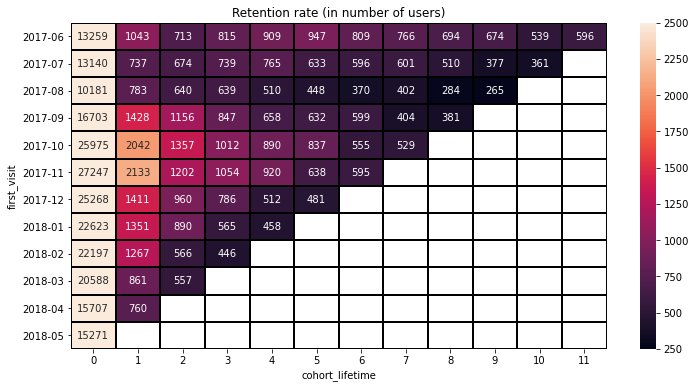

In [57]:
plt.figure(figsize=(12, 6))
plt.title("Retention rate (in number of users)")
sns.heatmap(retention_n_users_table, 
            annot=True, 
            fmt='.0f', 
            linewidths=1, 
            linecolor='black', 
            vmax=2500, vmin=250)
plt.show()

In [58]:
# Calculating mean cohort

mean_cohort = retention_rate_table.mean(axis=0)
mean_cohort = mean_cohort.rename('Mean cohort')

mean_cohort_desktop = retention_rate_desktop.mean(axis=0)
mean_cohort_desktop = mean_cohort_desktop.rename('Mean cohort')

mean_cohort_touch = retention_rate_touch.mean(axis=0)
mean_cohort_touch = mean_cohort_touch.rename('Mean cohort')

In [59]:
# Adding mean cohort to retention tables

retention_rate_table = retention_rate_table.append(mean_cohort)

retention_rate_desktop = retention_rate_desktop.append(mean_cohort_desktop)

retention_rate_touch = retention_rate_touch.append(mean_cohort_touch)

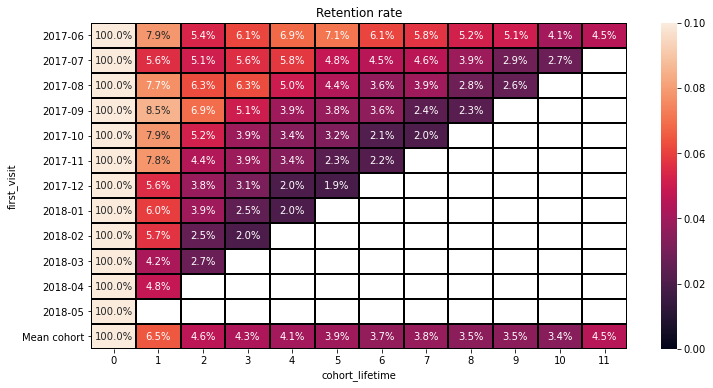

In [60]:
plt.figure(figsize=(12, 6))
plt.title("Retention rate")
sns.heatmap(retention_rate_table, annot=True, fmt='.1%', linewidths=1, linecolor='black', vmax=0.1, vmin=0) 
plt.show()

<font color='navy'>  We see decrease in retention rate in last cohorts. If seasonality is actually the case, so it could explain it. In this case spring cohorts will have expectadly lower retention rate, because demand for the service is lower in warm months.  
But it's just one possible aasumption, so reasons for retention rate decrease should be found and analyzed. </font>

<font color='navy'>  Now let's see if there is any difference in retention rate between users who came from different types of devices. </font>

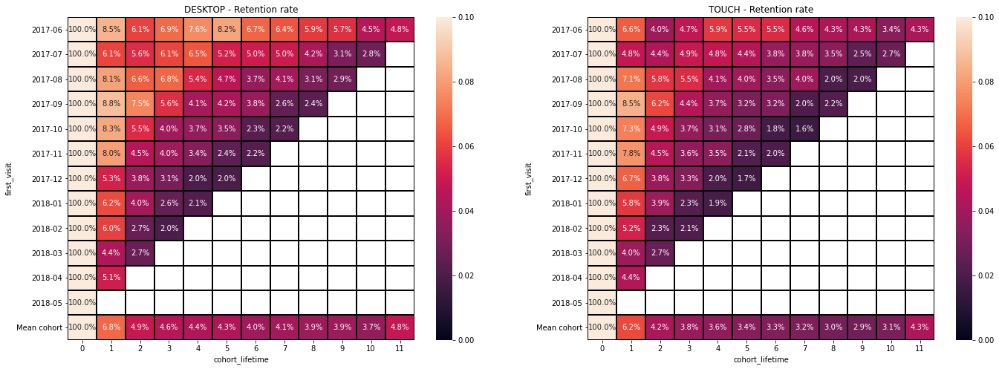

In [61]:
fig = plt.figure(figsize=(23, 8))

plt.subplot(121)
plt.title('DESKTOP - Retention rate')
sns.heatmap(retention_rate_desktop, annot=True, fmt='.1%', linewidths=1, linecolor='black', vmax=0.1, vmin=0)

plt.subplot(122)
plt.title('TOUCH - Retention rate')
sns.heatmap(retention_rate_touch, annot=True, fmt='.1%', linewidths=1, linecolor='black', vmax=0.1, vmin=0)

plt.show()

<font color='navy'> Retention rate of users who came from __desktop__ type is higher than that of users from __touch__ devices. </font>

---

<font color='navy'> <h3><ins>Conclusion:</h3>  
<b>1.</b> <ins>User activity</ins>  
- User activity is higher during cold months. Is it related to seasonality or just to marketing budget? Let's check, when we analyse marketing part.  
- There are two strange peaks on daily activity graph - one day with very high activity and one with only 1 visits. It needs to be reported and checked.  
    
<b>2.</b> <ins>Number of sessions</ins>  
- 1.08 sessions per user every day on average.  
- 73% of all sessions were made from desktop devices  
- Sessions from desktop devices much more often on weekdays than on weekends, while sessions from touch devices are on the contrary, but with smaller gap between weekdays and weekends.  
    
<b>3.</b> <ins>Length of sessions</ins>  
- Relevancy of sessions with long duration should be checked for future analysis of this metric. Very possible, that in case of those sessions service is just work in background mode instead of active using.   
- Desktop devices' sessions on average are significantly longer than sessions from touch devices.  
   
<b>4.</b> <ins>Retention rate</ins>  
- Retention rate in the last couple of cohorts. Possible reasons should analysed.     
- Retention rate of desktop devices is higher than that of touch devices.  
- Additional finding: visitors who came from touch type of device much often tended to use desktop devices in the future, than vice versa.  
    
    
-------

## 2.2 Sales <a id='2.2'></a> 

### 2.2.1 When people strart buying <a id='2.2.1'></a> 

In [62]:
# Table with the number of purchases, total revenue per user and first order date

orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
orders = orders.query('order_month != "2018-06-01"')

purchases_revenue_firstorder_user = orders.groupby('uid', as_index=False).agg({'order_month':'count', 'revenue':'sum', 'buy_ts':'min'})
purchases_revenue_firstorder_user.columns = ['uid', 'n_purchases', 'revenue_total', 'first_order']

In [63]:
# Creating table with all users of our site and adding info of their purchases for those who became customer

users_table = visits[['uid', 'source_id', 'first_visit', 'first_visit_ts']].copy()
users_table = users_table.drop_duplicates('uid')
users_table = users_table.merge(purchases_revenue_firstorder_user, on='uid', how='left')

In [64]:
# Adding conversion column (in days)

users_table['conversion_days'] = users_table['first_order'] - users_table['first_visit_ts']
users_table['conversion_days'] = users_table['conversion_days'] / np.timedelta64(1, 'D')
users_table['conversion_days'] = np.floor(users_table['conversion_days'])

In [65]:
# Filling missing values

users_table = users_table.fillna(-999)

In [66]:
# Dropping columns with first visit and first order + converting from float to int where possible

users_table = users_table[['uid', 'source_id', 'n_purchases', 'revenue_total', 'conversion_days']]
users_table['conversion_days'] = users_table['conversion_days'].astype('int')
users_table['n_purchases'] = users_table['n_purchases'].astype('int')

In [67]:
# Creating table of customers (as a slice of users_table)

customers_table = users_table.query('n_purchases != -999').copy()

customers_table['revenue_total'] = customers_table['revenue_total'].round(2)

<font color='navy'> During futher analysis it turned out, that __source 7__ brought only 33 visitors and 1 customer, so this source will be __excluded__ from the table already on this stage as statistically not significant and not representative and in order to not spoil the data and graphs.</font> 

In [68]:
# Getting rid of source 7

users_table = users_table.query('source_id != 7')
customers_table = customers_table.query('source_id != 7')

In [69]:
print('Average conversion rate for all sources (days): {}'.format(int(customers_table.conversion_days.mean())))
print('--------------------------------------------------')
print()
print('Average conversion rate for different sources:')
customers_table.groupby('source_id', as_index=False)['conversion_days'].mean().astype('int')

Average conversion rate for all sources (days): 16
--------------------------------------------------

Average conversion rate for different sources:


,source_id,conversion_days
0,1,14
1,2,21
2,3,16
3,4,16
4,5,13
5,9,32
6,10,13


<font color='navy'> So, the average conversion rate without differentiation on sources is 16 days, but for different sources conversion rate differs.   
Five of seven sources show a conversion rate that is slightly lower than average or equal to it (13-16), and two of them show a significantly higher rate (21 and 32). </font> 

<font color='navy'> Now let's separate customers into cohorts according to their conversion rate and see in a more detailed way on users' conversion and on the effectiveness of every source from this point of view.  
Next cohorts will be used for the analysis:  
1. __1st day__(0 day)  
2. __2nd day - end of the first week__ (1-6 day)  
3. __8th day - end of the first month__ (7-29 day)  
4. __End of the first month and futher__ (30 day -...) </font>   

----

In [70]:
# Adding cohort column

customers_table['cohort'] = pd.cut(x=customers_table['conversion_days'], 
                                   bins=[0,1,7,30,365], 
                                   right=False,
                                   labels=['0d', '1-6 days', '7-29 days', '30-364 days'])

In [71]:
# Creating table with number of customers and their share in overall number of clients in every cohort 

sources_cohorts_num = customers_table.groupby('cohort', as_index=False).agg({'uid':'count'})
sources_cohorts_num.columns = ['cohort', 'n_customers']
sources_cohorts_num['share_%'] = round(sources_cohorts_num['n_customers'] / customers_table.uid.count() * 100, 2)

In [72]:
fig = px.bar(sources_cohorts_num.reindex([0,1,3,2]), 
             x='cohort', 
             y='share_%', 
             color='cohort', 
             color_discrete_sequence=['tomato', 'blue', 'gold', 'green'],  
             hover_data=['n_customers'], height=450)
fig.update_layout(title_text='Share of cohorts in overall customers', 
                  yaxis_title_text="Share of cohort's customers in overall number (%)", 
                  xaxis_title_text='Cohort')
fig.show()

<font color='navy'> Most of the customers (72%) made their first purchase on the day of their first visit.  
8% became customers in the period between the end of the first day to the end of the first week after first visit.  
And more 6.4% in the period between the end of the first week to the end of the first month.  
But 13.6% of customers made their first purchase in the folowing 11 months after the end of the first month after first visit. This is definitely a result of marketing efforts.  
    
----

<font color='navy'> Now let's check how these cohorts look when separated to sources </font> 

In [73]:
# Building a table with shares

sources_cohorts_shares = round(customers_table.groupby(['source_id','cohort'])['uid'].count() / 
      customers_table.groupby('source_id')['uid'].count() * 100, 2)
sources_cohorts_shares = sources_cohorts_shares.reset_index()
sources_cohorts_shares.columns = ['source_id', 'cohort', 'share_of_cohort_in_source_%']

In [74]:
# Building a table with number of customers

sources_cohorts_num = customers_table.groupby(['source_id','cohort'])['uid'].count()
sources_cohorts_num = sources_cohorts_num.reset_index()
sources_cohorts_num.columns = ['source_id', 'cohort', 'number_of_customers']

In [75]:
cohorts = ['0d', '1-6 days', '7-29 days', '30-364 days']

fig = go.Figure()

for cohort in cohorts:    
    plot_slice = sources_cohorts_shares.query('cohort == @cohort')
    
    source_coh = go.Bar(y=plot_slice['source_id'],
                        x=plot_slice['share_of_cohort_in_source_%'],
                        name=cohort, 
                        orientation='h')
    fig.add_trace(source_coh)
    
fig.update_layout(barmode='stack', 
                  title_text="Share of cohorts in overall customers from every source",
                  xaxis_title_text='Share of customers in cohort (%)', 
                  yaxis_title_text='Source ID',  
                  colorway=['tomato', 'blue', 'gold', 'green'])
fig.update_yaxes(type='category')
fig.show()

<font color='navy'> Only sources __2__ and __9__ have significant difference from other sources in terms of conversion speed of customers. Their conversion is slower, as we saw before according to their average conversion days.  
So maybe users from these two sources needed more marketing efforts and expenses to became customers in the end. If there were some additional expenses except for their primary attraction, it needs to be taken into consideration.  </font> 

-----

### 2.2.2 Number of purchases <a id='2.2.2'></a> 

In [76]:
fig = px.box(customers_table, 
             y="n_purchases", 
             width=450, 
             height=450)
fig.update_layout(title_text="Number of pruchases per customer", 
                  yaxis_title_text="Numbers of purchases")
fig.show()
customers_table.n_purchases.describe()

count    36521.000000
mean         1.380384
std          3.454554
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        239.000000
Name: n_purchases, dtype: float64

In [77]:
print('Share of customers who made more than 1 purchase: {:.2%}'.format
      (len(customers_table.query('n_purchases > 1'))/len(customers_table))
     )

Share of customers who made more than 1 purchase: 17.23%


<font color='navy'> We can clearly see, that most of the customers made only one purchase and only __17%__ of customers made more than 1 purchase. But there are also several "whales" - clients who bought a lot, even more than 100 times.  
Now we can examine what sources, devices and cohorts were the most effective in terms of bringing customers who buy not only once. We'll compare them on basis of the __average number of purchases__ and __the share of clients that made more than 1 purchase__.</font> 

<font color='navy'> <ins>__Here and during futher analysis a device that was used for the first visit on the site will be considered as user's device.__ </ins> </font>

In [78]:
# Creating table with required parameters for every source

source_purchases = customers_table.groupby('source_id', as_index=False).agg({'n_purchases':'mean'}).round(2)
source_purchases.columns = ['source_id', 'avg_n_purchases']

source_purchases['multiple_purchase_share'] = 0

for source in source_purchases['source_id']:
    source_purchases.loc[source_purchases['source_id'] == source, ['multiple_purchase_share']] = round(
        len(customers_table.query('source_id == @source and n_purchases > 1')) / 
        len(customers_table.query('source_id == @source')) * 100, 
        2
    )

In [79]:
# Creating table with all users and their device and the same table with customers
device_user = first_visit[['uid', 'device_of_first_visit']].copy()
device_user.columns = ['uid', 'device']
device_customer = customers_table.merge(device_user, on='uid', how='left')[['uid', 'device']].copy()

# Calculating number of customers for every device type
device_customer_count = device_customer.groupby('device', as_index=False).agg({'uid':'nunique'})
device_customer_count.columns = ['device', 'n_customers']

# Calculating number of customers who made multiple purchases for every device
multiple_orders = customers_table.query('n_purchases > 1').merge(device_customer, 
                                                                 on='uid',
                                                                 how='left').groupby('device',
                                                                                     as_index=False).agg({'uid':'nunique'})
multiple_orders.columns = ['device', 'n_return_customers']

# Calculating share of customers who made multiple purchases for every device
multiple_orders_share = device_customer_count.merge(multiple_orders, on='device')
multiple_orders_share['share_of_return_customers'] = round(multiple_orders_share['n_return_customers'] / 
                                                           multiple_orders_share['n_customers']*100, 
                                                           2)

# Adding average purchase number
avg_n_purchase = customers_table.merge(device_customer, 
                                       on='uid', 
                                       how='left').groupby('device', 
                                                           as_index=False).agg({'n_purchases':'mean'}).round(2)
avg_n_purchase.columns = ['device', 'avg_n_purchase']
multiple_orders_share = multiple_orders_share.merge(avg_n_purchase, on='device')

In [80]:
fig = px.bar(multiple_orders_share, 
             x='device', 
             y='share_of_return_customers', 
             hover_data=['n_customers', 'n_return_customers', 'avg_n_purchase'], 
             color='device',
             color_discrete_sequence=['tomato', 'navy'], 
             text='share_of_return_customers',
             width=600, height=400)
fig.update_layout(title_text='Share of customers who made >1 purchase (different devices)', 
                  yaxis_title_text="Share of customers %", 
                  xaxis_title_text='Device')
fig.show()

<font color='navy'> Share of users who made more than 1 purchase is almost identical for two type of devices (__17.12%__ and __17.64%__) and average number of purchases is also close (__1.4__ and __1.3__ respectively).  
So we can conclude, that device of the first visit doesn't really affect number of customers' purchases. </font> 

In [81]:
fig = px.bar(source_purchases, 
             x='source_id', 
             y='multiple_purchase_share', 
             hover_data=['source_id', 'avg_n_purchases'], 
             color='multiple_purchase_share',
             width=800, height=500)
fig.update_layout(title_text='Share of customers who made >1 purchase', 
                  yaxis_title_text="Share of customers %", 
                  xaxis_title_text='Source')
fig.update_xaxes(type='category')
fig.show()

source_purchases

,source_id,avg_n_purchases,multiple_purchase_share
0,1,1.78,22.87
1,2,1.79,24.79
2,3,1.20,13.44
3,4,1.25,15.47
4,5,1.36,15.85
5,9,1.45,26.64
6,10,1.17,12.57


<font color='navy'> Sources __1__, __2__ and __9__ have share of clients who made more than one purchase greater (__22.9%__, __24.8%__ and __26.6%__ respectively) than average (__17.2%__). All the rest have share lower than average.  
Definitely this share is correlated with the average number of purchases, we see the similar picture - the same three sources have numbers that greater (__1.78__, __1.79__ and __1.45__) than average (__1.38__), and the rest lower. </font> 

----

<font color='navy'> Now let's build the same table for cohorts, that has already been used previously. </font> 

In [82]:
cohorts_purchase_table = round(customers_table.groupby('cohort', as_index=False)['n_purchases'].mean(), 2)
cohorts_purchase_table.columns = ['cohort', 'avg_num_purchases']

In [83]:
cohort_num_pur = customers_table.groupby('cohort', as_index=False)['n_purchases'].count()

multi_purchase_num = []
for cohort in cohorts_purchase_table['cohort']:
    multi_pur = len(customers_table.query('cohort == @cohort and n_purchases > 1'))
    multi_purchase_num.append(multi_pur)
    
cohort_num_pur['multi_purchase_cust_num'] = multi_purchase_num
cohort_num_pur['multi_purchase_share_cust'] = round(cohort_num_pur['multi_purchase_cust_num'] / cohort_num_pur['n_purchases']*100,2)

In [84]:
cohorts_purchase_table = cohorts_purchase_table.merge(cohort_num_pur, on='cohort')

In [85]:
fig = px.bar(cohorts_purchase_table.reindex([0, 1, 3, 2]), 
             x='cohort', 
             y='multi_purchase_share_cust', 
             hover_data=['avg_num_purchases', 'multi_purchase_cust_num'], 
             color='cohort',
             color_discrete_sequence=['tomato', 'blue', 'gold', 'green'],
             width=700, height=400)
fig.update_layout(title_text='Share of customers who made >1 purchase', 
                  yaxis_title_text="Share of customers %", 
                  xaxis_title_text='Cohort')
fig.show()

cohorts_purchase_table.reindex([0, 1, 3, 2]).reset_index(drop=True)

,cohort,avg_num_purchases,n_purchases,multi_purchase_cust_num,multi_purchase_share_cust
0,0d,1.30,26359,4085,15.50
1,1-6 days,1.73,2862,575,20.09
2,30-364 days,1.47,4965,1102,22.20
3,7-29 days,1.69,2335,530,22.70


<font color='navy'> The only cohort that differs significantly is "0 days". These customers more seldom make more than one purchase and as a result, average number of purchases per customer is the lowest in this cohort.  
Most probably that not enough efforts were made to motivate customers from this cohort buy more. And as long as this cohort is the biggest one, there is a room for significant increase of sales. </font> 

-----

### 2.2.3  Purchase size <a id='2.2.3'></a> 

<font color='navy'> Column with average purchase size for each client will be added. </font> 

In [86]:
customers_table['avg_purchase'] = round(customers_table['revenue_total'] / customers_table['n_purchases'], 2)

<font color='navy'> Now let's analyse this parametr and for the begining box plot and descriptive statistics will be called. </font> 

In [87]:
fig = px.box(customers_table, 
             y="avg_purchase", 
             width=450, 
             height=450)
fig.update_layout(title_text="Average purchase size of every customer",
                  yaxis_title_text="Average purchase size")
fig.show()

customers_table.avg_purchase.describe()

count    36521.000000
mean         4.093019
std          7.671487
min          0.000000
25%          1.280000
50%          2.490000
75%          4.890000
max        657.469971
Name: avg_purchase, dtype: float64

<font color='navy'> Perhaps there are several corporative clients which made some really big orders, because the difference between average order and these several big orders is just huge. </font> 

<font color='navy'> So let's compare different sources, devices and cohorts on the basis of average order size.</font> 

In [88]:
# Creating table with average purchase per device

device_avg_purch = customers_table.merge(device_customer, 
                                         on='uid').groupby('device', 
                                                           as_index=False).agg({'avg_purchase':'mean', 
                                                                                'uid':'count'}).round(2)
device_avg_purch.columns = ['device', 'avg_purchase', 'n_customers']

In [89]:
fig = px.bar(device_avg_purch, 
             x='device', 
             y='avg_purchase', 
             hover_data=['n_customers'], 
             color='device',
             color_discrete_sequence=['tomato', 'navy'], 
             width=600, height=400)
fig.update_layout(title_text='Average purchase size for different devices', 
                  yaxis_title_text="Average purchase size", 
                  xaxis_title_text='Device')
fig.show()

<font color='navy'> Users who came to the service from desktop type of devices have a slightly higher average size of purchase (__4.16__ against __3.81__).</font> 

In [90]:
# Sources table

source_reven = customers_table.groupby('source_id', as_index=False).agg({'avg_purchase':'mean', 'uid':'count'}).round(2)
source_reven.columns = ['source_id', 'avg_puchase_size', 'n_customers']

In [91]:
fig = px.bar(source_reven, 
             x='source_id', 
             y='avg_puchase_size', 
             hover_data=['n_customers'],
             color='avg_puchase_size', 
             width=800, height=500)
fig.update_layout(title_text='Average purchase size for different sources', 
                  yaxis_title_text="Average purchase size", 
                  xaxis_title_text='Source')
fig.update_xaxes(type='category')
fig.show()

source_reven

,source_id,avg_puchase_size,n_customers
0,1,4.33,3743
1,2,4.72,4324
2,3,3.92,9136
3,4,4.09,9822
4,5,4.21,6840
5,9,3.29,1415
6,10,2.78,1241


<font color='navy'> The difference in size of average purchase doesn't differe significantly, except for sources __9__ and __10__, which not only have smaller average size of purchase, but also brought the least number of clients. </font> 

<font color='navy'> Now let's examine cohorts. </font> 

In [92]:
# Cohorts table

cohort_reven = customers_table.groupby('cohort', as_index=False).agg({'avg_purchase':'mean', 
                                                                      'uid':'count'}).round(2).reindex([0, 1, 3, 2]).reset_index(drop=True)
cohort_reven.columns = ['cohort', 'avg_puchase_size', 'n_customers']

In [93]:
fig = px.bar(cohort_reven, 
             x='cohort', 
             y='avg_puchase_size', 
             hover_data=['n_customers'], 
             color='cohort',
             color_discrete_sequence=['tomato', 'blue', 'gold', 'green'], 
             width=700, height=400)
fig.update_layout(title_text='Average purchase size in different cohorts', 
                  yaxis_title_text="Average purchase size", 
                  xaxis_title_text='Cohort')
fig.show()

cohort_reven

,cohort,avg_puchase_size,n_customers
0,0d,4.02,26359
1,1-6 days,4.17,2862
2,30-364 days,4.31,4965
3,7-29 days,4.33,2335


<font color='navy'> There isn't considerable difference in average purchase size between different cohorts. </font> 

-----

### 2.2.4  LTV <a id='2.2.4'></a> 

<font color='navy'> Customers will be divided into cohorts according to their month of first purchase and then LTV for such cohorts will be calculated.

In [94]:
# Adding first_order_month, order_month and source to orders table

first_order_month = orders.groupby('uid').agg({'order_month':'min'}).reset_index()
first_order_month.columns = ['uid', 'first_order_month']
source_uid = customers_table.groupby('uid').agg({'source_id':'mean'}).reset_index()

orders = orders.merge(first_order_month, on='uid')
orders = orders.merge(source_uid, on='uid')

In [95]:
# Building cohorts table

cohorts_month_full = orders.groupby(['first_order_month', 'order_month']).agg({'revenue':'sum'}).reset_index()

cohorts_month_full['age'] = (cohorts_month_full['order_month'] - cohorts_month_full['first_order_month']) / np.timedelta64(1, 'M')
cohorts_month_full['age'] = cohorts_month_full['age'].round().astype('int')
cohorts_month_full['revenue'] = cohorts_month_full['revenue'].astype('int')

In [96]:
# Finding number of new customers for every month

n_cust_month_full = orders.groupby('first_order_month', as_index=False).agg({'uid':'nunique'})
n_cust_month_full.columns = ['first_order_month', 'n_customers']

In [97]:
# Merging n_customers with cohort table and calculating LTV

cohorts_month_full = cohorts_month_full.merge(n_cust_month_full, on='first_order_month')
cohorts_month_full['LTV'] = round(cohorts_month_full['revenue'] / cohorts_month_full['n_customers'], 2)

In [98]:
# Changing format for plot

cohorts_month_full_plot = cohorts_month_full.copy()
cohorts_month_full_plot['first_order_month'] = cohorts_month_full_plot['first_order_month'].dt.date

In [99]:
# Building final LTV table

LTV_table = cohorts_month_full_plot.pivot_table(index='first_order_month',
                                                columns='age',
                                                values='LTV',
                                                aggfunc='mean').cumsum(axis=1).round(2)

In [100]:
# Calculating LTV for mean cohort

mean_cohort_LTV = LTV_table.mean(axis=0).round(2)
mean_cohort_LTV = mean_cohort_LTV.rename('Mean cohort')

In [101]:
# Adding mean cohort to the LTV table

LTV_table = LTV_table.append(mean_cohort_LTV)

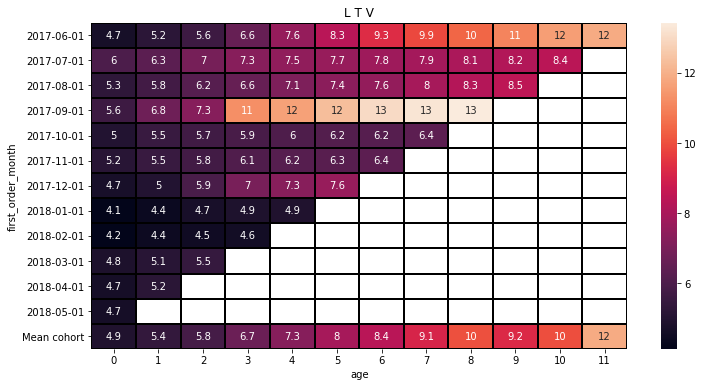

In [102]:
plt.figure(figsize=(12, 6))
plt.title('L T V')
sns.heatmap(LTV_table, annot=True, linewidths=1, linecolor='black')
plt.show()

-----

<font color='navy'> Now let's calculate LTV with separation for different sources. </font> 

In [103]:
# Building cohorts table

cohorts_month = orders.groupby(['first_order_month', 'source_id', 'order_month']).agg({'revenue':'sum'}).reset_index()

cohorts_month['age'] = (cohorts_month['order_month'] - cohorts_month['first_order_month']) / np.timedelta64(1, 'M')
cohorts_month['age'] = cohorts_month['age'].round().astype('int')
cohorts_month['revenue'] = cohorts_month['revenue'].astype('int')

In [104]:
# Finding number of new customers for every month

n_cust_month = orders.groupby(['first_order_month', 'source_id']).agg({'uid':'count'}).reset_index()
n_cust_month.columns = ['first_order_month', 'source_id', 'n_customers']

In [105]:
# Merging n_customers with cohort table and calculating LTV

cohorts_month = cohorts_month.merge(n_cust_month, on=['first_order_month', 'source_id'])
cohorts_month['LTV'] = round(cohorts_month['revenue'] / cohorts_month['n_customers'], 2)

In [106]:
cohorts_month_plot = cohorts_month.copy()
cohorts_month_plot['first_order_month'] = cohorts_month_plot['first_order_month'].dt.date

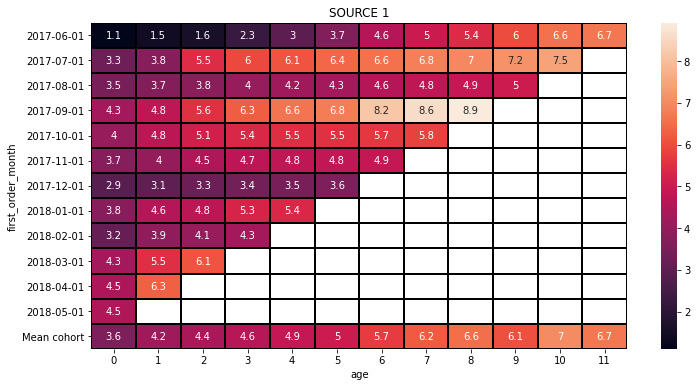

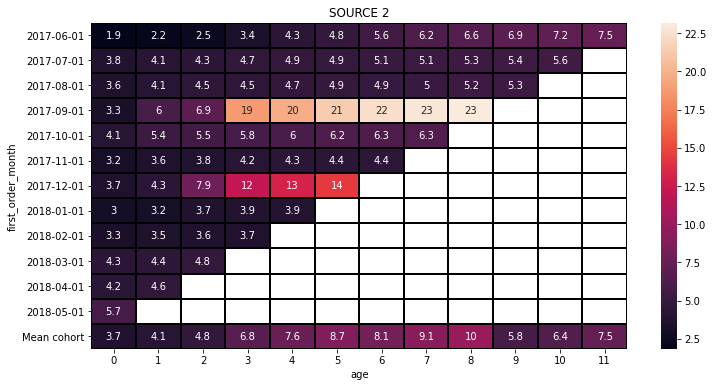

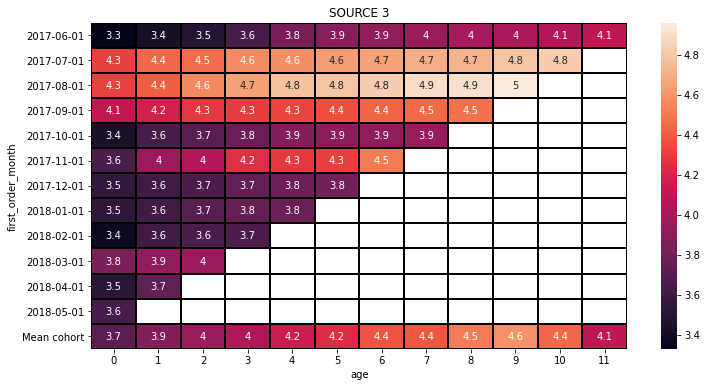

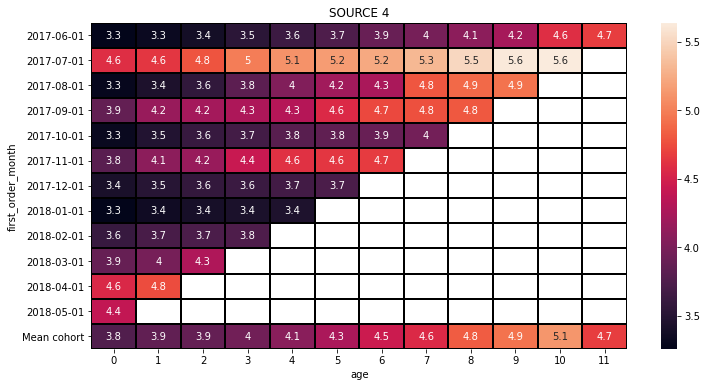

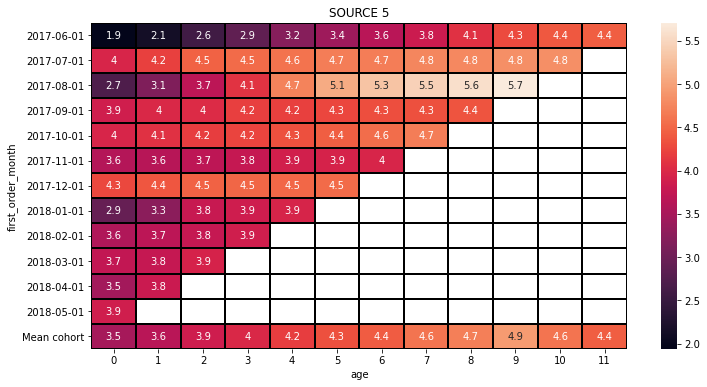

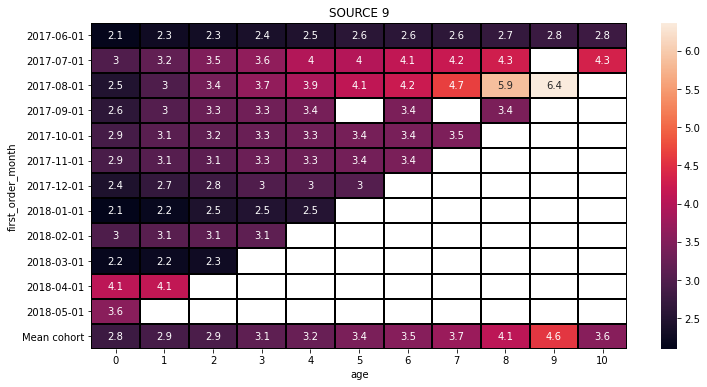

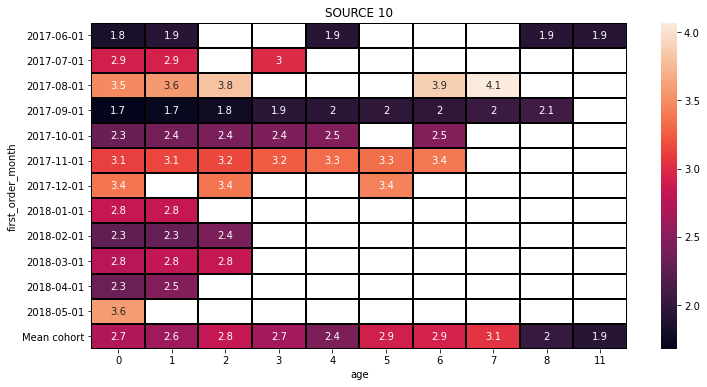

In [107]:
sources = sorted(list(cohorts_month.source_id.unique()))

for source in sources:
    LTV_source = cohorts_month_plot.query('source_id == @source').pivot_table(index='first_order_month',
                                                                  columns='age',
                                                                  values='LTV',
                                                                  aggfunc='mean').cumsum(axis=1)
    mean_cohort_source_LTV = LTV_source.mean(axis=0).round(2)
    mean_cohort_source_LTV = mean_cohort_source_LTV.rename('Mean cohort')
    LTV_source = LTV_source.append(mean_cohort_source_LTV)
    
    plt.figure(figsize=(12, 6))
    plt.title('SOURCE '+str(source))
    sns.heatmap(LTV_source, annot=True, linewidths=1, linecolor='black') 
    plt.show()

<font color='navy'> Now we have table for every source with cohorts of clients and their average LTV. We'll be able to understand whether these numbers are good only when we compare them with CAC and calculate ROMI. But even now we can definitely say, that some resources bring us clients who continue to show good numbers in the months that after the month of their first purchase. For example source __1__ and __2__.  
And there are sources __9__ and __10__ whose numbers show that the customers' purchase activity isn't significant after first month.</font> 

<font color='navy'> <h3><ins>Conclusion:</h3>  
<b>1.</b> <ins>Conversion from visitors to customers</ins>  
- Average conversion = 16 days  
- 72% of customers made their first purchase on the day of their first visit  
8% from 2nd day to the end of the first week  
6.4% from the end of first week to the end of the first month  
13.6% from the end of the first month to the end of the first year  
- All sources except for __2__ and __9__ are quite similar in terms of these conversion cohorts' shares. Sources __2__ and __9__ have slower conversion.  
    
<b>2.</b> <ins>Purchases</ins>  
- Only 17% of customers made more than 1 purchase.  
- Device that was used for the first visit doesn't influence share of return customers.   
- But there is a significant difference between customers who came from different sources. Sources __1__, __2__ and __9__ are the best in terms of share of return customers.  
- Customers who made their first purchase on the day of their first visit more seldom make more than 1 purchase.  
- Average purchase size is smaller among customers who came from sources __9__ and __10__.
    
<b>3.</b> <ins>LTV</ins>  
- LTV was calculated for all the customers and with separation on the sources. Now it needs to be compared with CAC to understand the profitability.     

## 2.3 Marketing <a id='2.3'></a> 

### 2.3.1 Sources' and devices' conversion rates <a id='2.3.1'></a> 

In [108]:
# Tables with number of users within every device group
device_user_count = device_user.groupby('device', as_index=False).agg({'uid':'nunique'})
device_user_count.columns = ['device', 'n_users']

# Merging of tables with users and customers per source and calculating conversion for every device
device_conversion = device_user_count.merge(device_customer_count, on='device')
device_conversion['conversion'] = round(device_conversion['n_customers'] / device_conversion['n_users'] *100, 2)

In [109]:
fig = px.bar(device_conversion, 
             x='device', 
             y='conversion',  
             text='conversion', 
             color='device',
             color_discrete_sequence=['tomato', 'navy'],
             hover_data=['n_customers'],
             width=600, height=400)
fig.update_layout(title_text='Conversion rate of devices', 
                  yaxis_title_text='Conversion %', 
                  xaxis_title_text='Device')
fig.update_xaxes(type='category')
fig.show()

<font color='navy'> Visitors who make their first visit on the site via desktop devices have much higher conversion rate (__18.17%__ against __10.85%__).  
Also most of customers came from that type of device (__80%__).</font> 

In [110]:
# Number of users from each source
source_conversion = users_table.groupby('source_id', as_index=False).agg({'uid':'count'}).copy()
source_conversion.columns = ['source_id', 'n_visitors']

# Number of customers from each source
customers_per_source = customers_table.groupby('source_id', as_index=False).agg({'uid':'nunique'}).copy()
customers_per_source.columns = ['source_id', 'n_customers']

# Merging 
source_conversion = source_conversion.merge(customers_per_source, on='source_id')

# Calculating conversion (%)
source_conversion['conversion'] = source_conversion['n_customers']/source_conversion['n_visitors']
source_conversion['conversion'] = round(source_conversion['conversion'] * 100, 2)
source_conversion['source_id'] = source_conversion['source_id'].astype('category')

In [111]:
fig = go.Figure()
bar_visitors = go.Bar(y=source_conversion['n_visitors'], 
                        x=source_conversion['source_id'], 
                        name='Visitors')
bar_customers = go.Bar(y=source_conversion['n_customers'], 
                        x=source_conversion['source_id'], 
                        name='Customers')
fig.add_trace(bar_visitors)
fig.add_trace(bar_customers)
fig.update_layout(barmode='group', 
                  title_text="Visitors and customers from different sources",
                  xaxis_title_text='Source', 
                  yaxis_title_text='Visitors/Customers')
fig.update_xaxes(type='category')
fig.show()

<font color='navy'> Sources __3__, __4__ and __5__ brought the biggest number of visitors and as a result clients, but their conversion is obviously the worse.  
Sources __1__ and __2__ look like the most efficient ones in terms of conversion rate.  
Let's build graph with conversion rate and check.</font> 

In [112]:
fig = px.bar(source_conversion, 
             x='source_id', 
             y='conversion', 
             color='conversion', 
             text='conversion', 
             hover_data=['n_visitors', 'n_customers'], 
             width=800, height=500)
fig.update_layout(title_text='Conversion rate of sources', 
                  yaxis_title_text='Conversion %', 
                  xaxis_title_text='Source ID')
fig.update_xaxes(type='category')
fig.show()

In [113]:
print("Average conversion rate: {:.2%}".format(source_conversion.conversion.mean()/100))

Average conversion rate: 19.38%


<font color='navy'> There is a significant difference in conversion rate between different sources, as expected.  
Only 3 of 7 sources have conversion rate higher than average, and source __1__ is an undisputed champion. </font> 

-----

<font color='navy'> <h4><ins>Conclusion about conversion:</h4>   
      
- Visitors who make their first visit on the site via desktop devices have much higher conversion rate (18.17% against 10.85%).  
- Source __1__ have the highest conversion (32%), while sources __3__, __4__ and __5__ have conversion that is considerably lower than average (~14%).

### 2.3.2 How much money was spent? <a id='2.3.2'></a> 

#### Overall

In [114]:
print('-------------------------------')
print('Overall marketing costs: {:.0f}'.format(costs['costs'].sum()))
print('-------------------------------')

-------------------------------
Overall marketing costs: 329132
-------------------------------


#### Per source

In [115]:
source_costs = costs.groupby('source_id', as_index=False)['costs'].sum()
source_costs['costs'] = source_costs['costs'].astype('int')
source_costs['share'] = round(source_costs['costs'] / source_costs['costs'].sum(), 2)

In [116]:
fig = px.bar(source_costs, 
             x='source_id', 
             y='costs', 
             color='costs', 
             hover_data=['share'], 
             width=600, height=400)
fig.update_layout(title_text='Overall costs per source', 
                  yaxis_title_text='Costs', 
                  xaxis_title_text='Source ID')
fig.update_xaxes(type='category')
fig.show()

<font color='navy'> The difference between investments in different sources is very big.  
43% of all marketing investments in sources were made in the source __3__, while source __1__ recieved only 6% despite the fact, that it has the highest conversion rate as we saw previously.</font> 

#### Monthly costs

In [117]:
costs['year_month'] = costs['dt'].dt.strftime('%Y-%m')

In [118]:
month_costs = costs.groupby('year_month', as_index=False)['costs'].sum()
month_costs['costs'] = month_costs['costs'].astype('int')

In [119]:
fig = px.bar(month_costs, 
             x='year_month', 
             y='costs', 
             color='costs', width=600, height=400)
fig.update_layout(title_text='Overall costs per month', 
                  yaxis_title_text='Costs', 
                  xaxis_title_text='Month')
fig.update_xaxes(type='category')
fig.show()

<font color='navy'> Monthly investments explain peaks of user activity, and so it seems that seasonality isn't a case here. </font> 

<font color='navy'> Now let's look on monthly marketing costs when separated on sources. </font> 

In [120]:
month_source_costs = costs.groupby(['year_month', 'source_id']).agg({'costs':'sum'}).reset_index()
month_source_costs['costs'] = month_source_costs['costs'].astype('int')

month_costs.columns = ['year_month', 'overall_month_costs']
month_source_costs = month_source_costs.merge(month_costs, on='year_month')

month_source_costs['share_of_source_in_month'] = round(month_source_costs['costs'] / month_source_costs['overall_month_costs'], 2)

In [121]:
for source in sources:
    source_slice = month_source_costs.query('source_id == @source')
    fig = px.bar(source_slice, 
                 x='year_month', 
                 y='costs', 
                 color='costs', width=600, height=400)
    fig.update_layout(title_text='Overall costs per month for source '+str(source), 
                      yaxis_title_text='Costs', 
                      xaxis_title_text='Month')
    fig.update_xaxes(type='category')
    fig.show()

<font color='navy'> When looking on the graphs, it seems that share of every source in overall marketing investments stayed relativiely stable, but sources __4__ and __5__ have some differences nevertheless.  
Let's calculate share of every source for every month and build a table where we'll be able to compare them.</font> 

In [122]:
print('--------------------------------------------------')
print('Share of source in marketing budget of every month')
print('--------------------------------------------------')
month_source_costs.pivot_table(index='year_month',columns='source_id',values='share_of_source_in_month',aggfunc='mean')

--------------------------------------------------
Share of source in marketing budget of every month
--------------------------------------------------


source_id,1,2,3,4,5,9,10
year_month,,,,,,,
2017-06,0.06,0.13,0.43,0.20,0.15,0.02,0.02
2017-07,0.06,0.13,0.42,0.19,0.16,0.02,0.02
2017-08,0.06,0.12,0.42,0.22,0.15,0.02,0.02
2017-09,0.06,0.12,0.41,0.21,0.16,0.02,0.02
2017-10,0.06,0.13,0.43,0.18,0.16,0.02,0.02
2017-11,0.06,0.14,0.45,0.14,0.17,0.02,0.02
2017-12,0.06,0.13,0.42,0.20,0.15,0.02,0.02
2018-01,0.07,0.12,0.44,0.17,0.16,0.02,0.02
2018-02,0.07,0.14,0.43,0.17,0.15,0.02,0.01


<font color='navy'> The first expression turned out to be right: share of most sources stayed relatively stable from month to month, but the share of sources __4__ and __5__ swings. </font> 

------

### 2.3.3 CAC <a id='2.3.3'></a> 

<font color='navy'> CAC should be found according to the date of first visit of the site. So to find CAC of every customer next things need to be found:  
   
1) Date of first visit for every customer  
2) Costs for every source on every day  
3) Number of visitors that became customers for every first day of visit  
4) CAC (by dividing costs into number of customers) of every particular customer according to their first visit date and the source they came from</font> 

In [123]:
# Finding first visit date and merging it to customers table

first_visit_date = visits.groupby('uid').agg({'date':'min'}).reset_index()
first_visit_date.columns = ['uid', 'dt']

customers_table = customers_table.merge(first_visit_date, on='uid', how='left')

In [124]:
# Finding CAC of every customer according to date of first visit + source and adding it to customers table 

n_cust_date = customers_table.groupby(['dt', 'source_id']).agg({'uid':'count'}).reset_index()
n_cust_date.columns = ['dt', 'source_id', 'n_customers']

costs_analysis = costs.merge(n_cust_date, on=['dt', 'source_id'])
costs_analysis['CAC'] = round(costs_analysis['costs'] / costs_analysis['n_customers'], 2)


cac_date_source = costs_analysis[['dt', 'source_id', 'CAC']].copy()

customers_table = customers_table.merge(cac_date_source, on=['dt', 'source_id'], how='left')

In [125]:
customers_table.columns = ['uid', 'source_id', 'n_purchases', 'revenue_total', 'conversion_days', 
                           'cohort', 'avg_purchase', 'first_visit', 'CAC']

<font color='navy'> Now, when we have CAC for every customer, we can calculate an average CAC of every month with separation on sources and without. </font> 

In [126]:
# Calculating CAC without separation on sources

n_cust_date_full = customers_table.groupby('first_visit').agg({'uid':'count'}).reset_index()
n_cust_date_full.columns = ['first_visit','n_customers']

costs_date = costs.groupby('dt', as_index=False).agg({'costs':'sum'})
costs_date.columns = ['first_visit', 'costs']
costs_date['costs'] = costs_date['costs'].astype('int')

costs_analysis_full = costs_date.merge(n_cust_date_full, on='first_visit')
costs_analysis_full['CAC'] = round(costs_analysis_full['costs'] / costs_analysis_full['n_customers'], 2)

cac_date_source_full = costs_analysis_full[['first_visit', 'CAC']].copy()
cac_date_source_full.columns = ['first_visit', 'CAC_full']

customers_table = customers_table.merge(cac_date_source_full, on='first_visit', how='left')

In [127]:
# Adding first_order_month to customers table

customers_table = customers_table.merge(first_order_month, on='uid')

In [128]:
# Calculating CAC for every first_order_month

CAC_month = customers_table.groupby('first_order_month').agg({'CAC_full':'mean'}).reset_index()
CAC_month.columns = ['first_order_month', 'CAC']
CAC_month['CAC'] = CAC_month['CAC'].round(2)

In [129]:
# Calculating CAC for each source in every first_order_month

CAC_month_source = customers_table.groupby(['first_order_month', 'source_id']).agg({'CAC':'mean'}).reset_index()
CAC_month_source['CAC'] = CAC_month_source['CAC'].round(2)

In [130]:
fig = go.Figure()

for source in sources:
    source_slice = CAC_month_source.query('source_id == @source')
    trace = go.Scatter(y=source_slice['CAC'], 
                       x=source_slice['first_order_month'], 
                       name='Source '+str(source))
    fig.add_trace(trace)
    
fig.update_layout(title_text='CAC for every month',
                 xaxis_title_text='Month', 
                  yaxis_title_text='CAC')
fig.show()

<font color='navy'> CAC of all sources grew during the year as we see on the graph.  
But we saw that about 20% of customers made their first purchase in period which is between 30 and 365 days after their first visit. So that means, that conversion rate for last months will grow and as a result CAC will go down.  
So it could be interesting to look on that graph one year later.  
  
CAC of source __3__ is extremely high. We'll look later how ROMI for this source looks like, but we can already see that this source is definitely unprofitable. </font> 

-----

### 2.3.4 ROMI <a id='2.3.4'></a> 

<font color='navy'> Now when we have LTV and CAC, we can calculate return on marketing investments (ROMI).  
We don't have information about the margin rate, so we'll consider all revenue as a profit.</font> 

<font color='navy'> Let's build ROMI tables for every source separately. </font> 

In [131]:
# Adding CAC to cohort table and calculating ROMI

cohorts_month_full = cohorts_month_full.merge(CAC_month, on='first_order_month')
cohorts_month_full['romi'] = round(cohorts_month_full['LTV'] / cohorts_month_full['CAC'], 2)

In [132]:
# Creating ROMI table

ROMI_plot = cohorts_month_full.copy()
ROMI_plot['first_order_month'] = ROMI_plot['first_order_month'].dt.date

ROMI_table = ROMI_plot.pivot_table(index='first_order_month',columns='age',values='romi',aggfunc='mean').cumsum(axis=1)

mean_cohort_ROMI = ROMI_table.mean(axis=0).round(2)
mean_cohort_ROMI = mean_cohort_ROMI.rename('Mean cohort')
ROMI_table = ROMI_table.append(mean_cohort_ROMI)

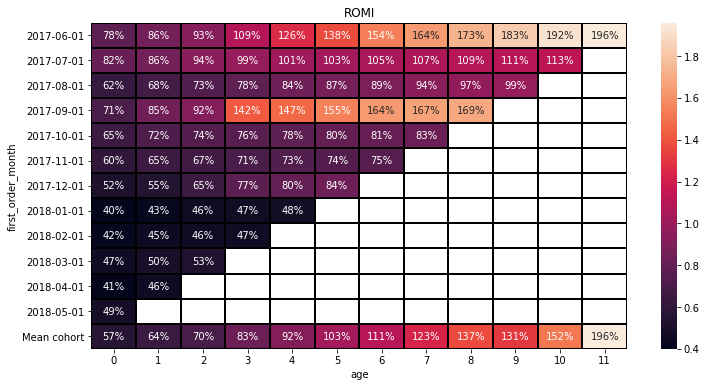

In [133]:
plt.figure(figsize=(12, 6))
plt.title('ROMI')
sns.heatmap(ROMI_table, annot=True, fmt='.0%', linewidths=1, linecolor='black')
plt.show()

In [134]:
# Adding CAC to cohort table and calculating ROMI (with separation on sources)

cohorts_month = cohorts_month.merge(CAC_month_source, on=['first_order_month', 'source_id'])
cohorts_month['romi'] = round(cohorts_month['LTV'] / cohorts_month['CAC'], 2)

ROMI_source_plot = cohorts_month.copy()
ROMI_source_plot['first_order_month'] = ROMI_source_plot['first_order_month'].dt.date

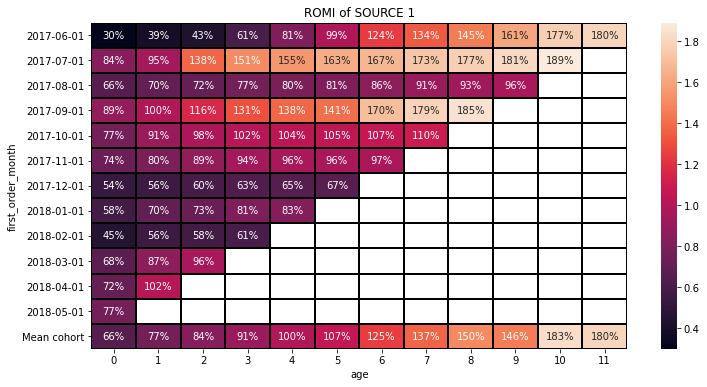

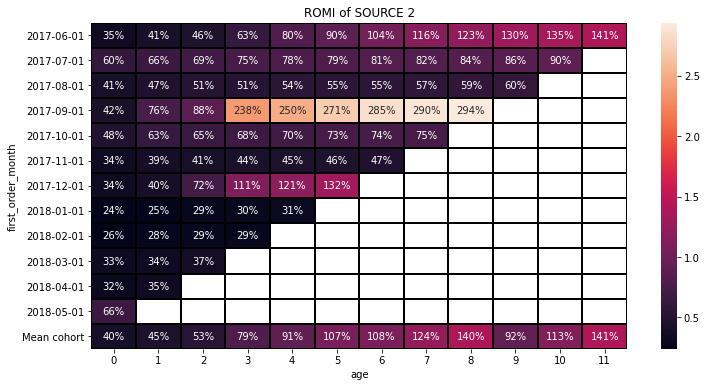

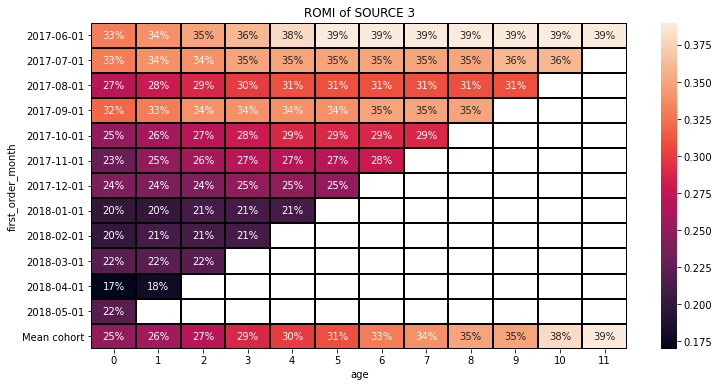

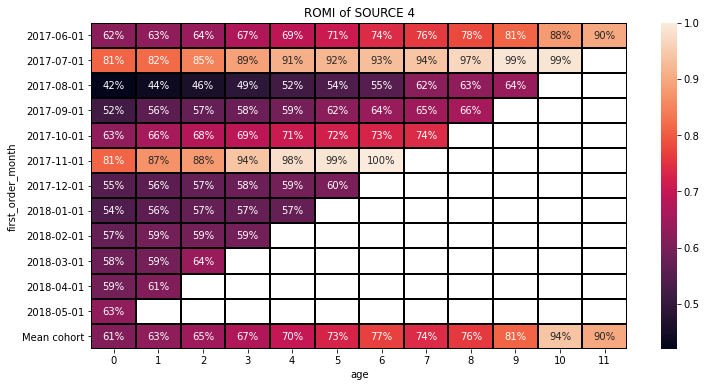

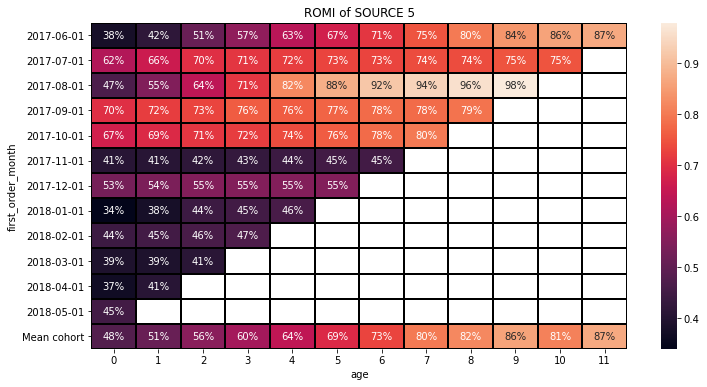

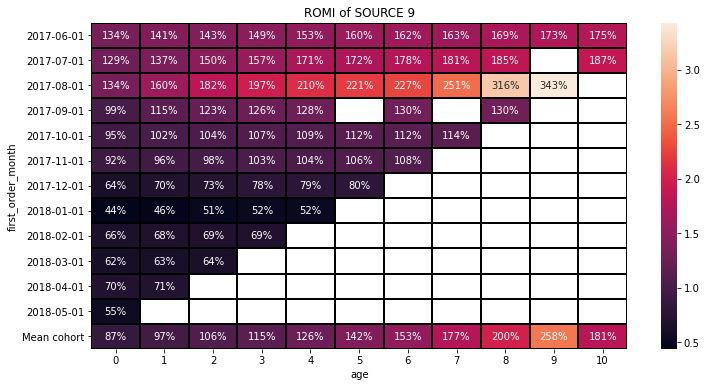

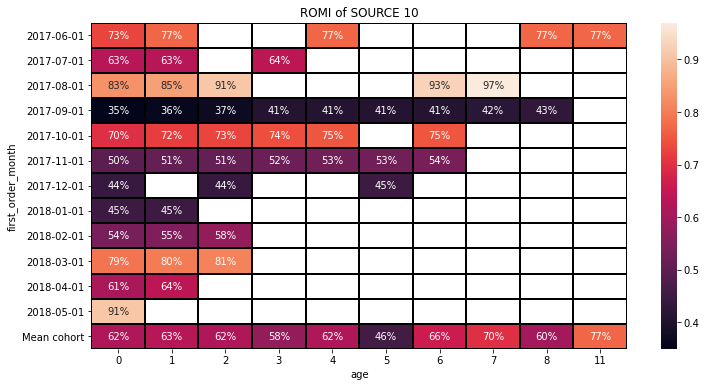

In [135]:
for source in sources:
    romi_table = ROMI_source_plot.query('source_id == @source').pivot_table(index='first_order_month',
                                                                  columns='age',
                                                                  values='romi',
                                                                  aggfunc='mean').cumsum(axis=1)
    mean_cohort_ROMI_source = romi_table.mean(axis=0).round(2)
    mean_cohort_ROMI_source = mean_cohort_ROMI_source.rename('Mean cohort')
    romi_table = romi_table.append(mean_cohort_ROMI_source)
    
    plt.figure(figsize=(12, 6))
    plt.title('ROMI of SOURCE '+ str(source))
    sns.heatmap(romi_table, annot=True, fmt='.0%', linewidths=1, linecolor='black')
    plt.show()


<font color='navy'> Source __1__, __2__ and __9__ are profitable on average as we can see. Also sourcec __4__ and __5__ has a potential to cover the marketing expanses.  
But all other sources are totally unprofitable. </font> 

In [136]:
# Creating table with number of month, when marketing investments return are fully returned for every source

sources_romi_full = {}

for source in sources:
    romi_table = ROMI_source_plot.query('source_id == @source').pivot_table(index='first_order_month',
                                                                  columns='age',
                                                                  values='romi',
                                                                  aggfunc='mean').cumsum(axis=1)
    mean_cohort_ROMI_source = romi_table.mean(axis=0).round(2)
#     source_romi = average_cohort_source[source]
    full_return = []
    for i in mean_cohort_ROMI_source.index:
        if mean_cohort_ROMI_source[i] >= 1:
            full_return.append(i)
    if len(full_return) != 0:
        full_return_month = min(full_return)
        sources_romi_full[source] = full_return_month
    else:
        sources_romi_full[source] = '-'
        
sources_month_of_full_return = pd.DataFrame.from_dict(sources_romi_full, orient='index').reset_index()
sources_month_of_full_return.columns = ['source_id', 'month_of_full_return']

In [137]:
sources_month_of_full_return

,source_id,month_of_full_return
0,1,4
1,2,5
2,3,-
3,4,-
4,5,-
5,9,2
6,10,-


<font color='navy'> This table shows a number of month when average customers from every source become profitable. Customers from source __9__ become profitable faster than from others. </font> 

## <ins>3. Conclusion </ins><a id='3'></a> 

<font color='navy'> <h2>Key aspects of the information about devices and sources obtained during analysis:</h2> </font> 
  
<font color='navy'> 
<h2><ins>Devices:</h2></ins>
<br>
      
1) __70%__ of visitors came from desktop type of devices.  
2) Visitors who came from desktop type of devices have higher __conversion rate__ (__18.17%__ against __10.85%__ of touch devices), so __80%__ of customers are visitors who came from desktop devices.  
3) __73%__ of all __sessions__ were made from a desktop type of devices and these __sessions__ are __50%__ longer on average.  
4) Users who registered from touch type of devices much often used desktop devices for their future sessions than users from desktop devices used touch devices.  
5) __Retention rate__ is higher for users who came from desktop devices than that for users from touch devices.  
6)	But the device of the first visit does not really affect future __purchases__: the share of customers who made more than 1 purchase is almost the same among customers who came from both types of devices.  Average size of the purchase also does not differ significantly.  
      
<h2><ins>Sources:</h2></ins> 
      
<h3>Source 1</h3>  
Number of visitors/customers from the source: <b>11746 / 3743</b> <br>
Conversion rate: <b>31.87%</b>  <br>
Share of customers who made more than 1 purchase: <b>22.87%</b>  <br>
Average number of purchases: <b>1.78 </b> <br>
Average purchase size: <b>4.33  </b><br>
Average days of conversion: <b>14  </b><br>
Share of annual marketing budget spent on the source: <b>6%  </b><br>
<ins>Profitability</ins>: <b>Yes (5 months)</b><br>
<h3>Source 2</h3>
Number of visitors/customers from the source: <b>19389 / 4324</b><br>
Conversion rate: <b>22.3%</b><br>
Share of customers who made more than 1 purchase: <b>24.79%</b><br>
Average number of purchases per customer: <b>1.79</b><br>
Average purchase size: <b>4.72</b><br>
Average days of conversion: <b>21</b><br>
Share of annual marketing budget spent on the source: <b>13%  </b><br>
<ins>Profitability:</ins> <b>Yes (6 months)</b><br>
<h3>Source 3</h3>
Number of visitors/customers from the source: <b>62669 / 9136</b><br>
Conversion rate: <b>14.58%</b><br>
Share of customers who made more than 1 purchase: <b>13.44%</b><br>
Average number of purchases per customer: <b>1.2</b><br>
Average purchase size: <b>3.92</b><br>
Average days of conversion: <b>16</b><br>
Share of annual marketing budget spent on the source: <b>43%  </b><br>
<ins>Profitability:</ins> <b>No</b><br>
<h3>Source 4</h3>
Number of visitors/customers from the source: <b>71903 / 9823</b><br>
Conversion rate: <b>13.66%</b><br>
Share of customers who made more than 1 purchase: <b>15.46%</b><br>
Average number of purchases per customer: <b>1.25</b><br>
Average purchase size: <b>4.09</b><br>
Average days of conversion: <b>16</b><br>
Share of annual marketing budget spent on the source: <b>19%  </b><br>
<ins>Profitability:</ins> <b>No</b><br>
<h3>Source 5</h3>
Number of visitors/customers from the source: <b>48881 / 6840</b><br>
Conversion rate: <b>13.99%</b><br>
Share of customers who made more than 1 purchase: <b>15.85%</b><br>
Average number of purchases per customer: <b>1.36</b><br>
Average purchase size: <b>4.21</b><br>
Average days of conversion: <b>13</b><br>
Share of annual marketing budget spent on the source: <b>16%  </b><br>
<ins>Profitability:</ins> <b>No</b><br>
<h3>Source 9</h3>
Number of visitors/customers from the source: <b>6770 / 1415</b><br>
Conversion rate: <b>20.9%</b><br>
Share of customers who made more than 1 purchase: <b>26.64%</b><br>
Average number of purchases per customer: <b>1.45</b><br>
Average purchase size: <b>3.29</b><br>
Average days of conversion: <b>32</b><br>
Share of annual marketing budget spent on the source: <b>2%  </b><br>
<ins>Profitability:</ins> <b>Yes (3 months)</b><br>
<h3>Source 10</h3>
Number of visitors/customers from the source: <b>6765 / 1241</b><br>
Conversion rate <b>18.34%</b><br>
Share of customers who made more than 1 purchase: <b>12.57%</b><br>
Average number of purchases per customer: <b>1.17</b><br>
Average purchase size: <b>2.78</b><br>
Average days of conversion: <b>13</b><br>
Share of annual marketing budget spent on the source: <b>2%  </b><br>
<ins>Profitability:</ins> <b>No</b><br>
 </font> 
 
 ----

<h2>Final conclusions and recommendations:</h2>

<h3><ins>Devices:</h3>  
  
It's possible, that the application or mobile version of the site for touch type of devices should be improved.  
There are a lot signals about it: lower conversion, transfer from touch device to desktop device, shorter sessions and lower retention rate.  
Maybe it's just the feature of the service and there is nothing that can be done for significant improvment of touch devices metrics, but if it isn't a case, there is a room for significant improvement.  
If the assumption about mobile service improvement will turn out to be wrong, so an emphasis should be put on desktop devices' users.  

<h3><ins>Sources:</h3>  
  
__Source__ __1__, __2__ and __9__ are the only profitable sources. They also have the highest conversion rate and share of return customers. But they got only __21%__ of all budget that was spent on the given time period (if the budget had been evenly distributed, every source would have got __~14.3%__).  
__Source 3__ got __43%__ of all budget, but showed the worse results: one of the lowest conversion rate and share of return customers and it didn't achieve even point of __40%__ ROMI on average cohort calculation.  
__Source 10__ showed average conversion rate and speed, but customers who came from it showed a bad performance in terms of purchases.  
__Source 4__ and __source 5__ were closed to achieve "break-even point" in terms of ROMI, so maybe it makes sense to watch after these clients longer, maybe they'll become profitable on the second year of their lifetime as customers. If there was an opportunity to improve conversion rate of these sources, they would probably become profitable.  
  
<ins>Recommendations for sources:</ins>  
If we assume that there is no limit of the sources, and we can increase the flow of customers from them in proportion to the increase in investment, there'll be given next recommendations:  
Stop investing in __source 3__ and __source 10__ at all if possible.  
Make emphasis on __source 1__, __source 2__ and __source 9__ (about __80-90%__ of all budget).   
The rest of the budget can be put in __source 4__ and __source 5__, while trying to work on increase of conversion rate for these sources, and look for ROMI of those sources during next year. According to results decision about continue of work with those sources should be made.